**Python libraries**
---


In [1]:
!pip install transformers

In [2]:
!pip install lime

In [3]:
!pip install anchor-exp

In [4]:
!pip install torch transformers spacy && python -m spacy download en_core_web_lg

2023-08-19 06:52:39.449835: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-19 06:52:40.629056: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-08-19 06:52:42.688122: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-08-19 06:52:42.688662: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA n

In [5]:
!pip install torch transformers spacy && python -m spacy download en_core_web_sm

2023-08-19 06:53:09.472614: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-19 06:53:10.644327: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-08-19 06:53:12.490371: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-08-19 06:53:12.490887: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA n

In [6]:
import warnings
warnings.filterwarnings('ignore')
%config Completer.use_jedi = False # if autocompletion doesnot work in kaggle notebook | hit tab

In [7]:
import numpy as np
import pandas as pd
#import torch
#import torch.nn as nn
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import transformers
from transformers import AutoModel, BertTokenizerFast
#device = torch.device("cuda")

In [8]:
! pip install eli5==0.13.0
! pip install jinja2==3.0.0

In [9]:
import scipy
import numpy as np
def monkeypath_itemfreq(sampler_indices):
   return zip(*np.unique(sampler_indices, return_counts=True))

scipy.stats.itemfreq=monkeypath_itemfreq


**Load Data**
---



In [11]:
df=pd.read_csv("kd_dataset.csv",usecols=["data","label"])
#df=pd.read_csv("mixed_domain_godamit.csv",usecols=["data","label","index"],index_col="index")

In [12]:
df=df.loc[0:len(df)/2.5]

In [13]:
df

,data,label
0,people power natives declare treaty rights pol...,1
1,trump son met russian lawyer damaging informat...,1
2,women testifying cosby court lets new york times,0
3,allegedly french magazine praising sisi respon...,0
4,trump meets biotech ceos farm advisers fret em...,1
...,...,...
32162,drinking methanol ethanol bleach prevent cure ...,1
32163,secret service investigating glenn beck video,0
32164,symptoms covid symptoms include fever cough sh...,1
32165,watch top videos leftist media want see kid ro...,0


In [14]:
import pandas as pd
#df1=pd.read_csv("covid_kd_val.csv",usecols=["data","label","index"],index_col="index")
df1=pd.read_csv("covid_kd_val.csv",usecols=["data","label"])
#df2=pd.read_csv("covid_kd_test.csv",usecols=["data","label","index"],index_col="index")
df2=pd.read_csv("covid_kd_test.csv",usecols=["data","label"])

In [15]:
df1

,data,label
0,whoever says covid like flu obviously know mat...,0
1,antiviral remdesivir prevents disease progress...,1
2,programming alert exclusive documentary origin...,0
3,antiviral remdesivir prevents disease progress...,1
4,feng county xuzhou city closed rumor,0
...,...,...
17530,nih launch public private partnership speed co...,1
17531,tough questions like covid,1
17532,wear mask protect frequently asked questions c...,1
17533,visualization secret history based greatgamein...,0


In [16]:
df2

,data,label
0,taking hot bath prevent new coronavirus diseas...,1
1,coronavirus vaccines months fake news,0
2,april different covid vaccine candidates devel...,1
3,claim german parliament passed law september c...,0
4,dominic raab said covid tests false positive rate,0
...,...,...
6815,royal palace confirms queen elizabeth tests po...,0
6816,claim new york times said tunisia country beta...,0
6817,mask resellers bought million masks one week,0
6818,rapid weather swings increase flu risk,1


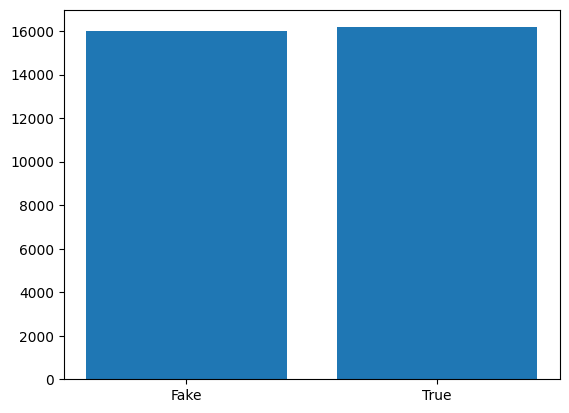

In [17]:
import matplotlib.pyplot as plt
classes = df.label.unique()
counts = []

for i in classes:
  count = len(df[df.label==i])
  counts.append(count)

plt.bar(['Fake', 'True'], counts)
plt.show()

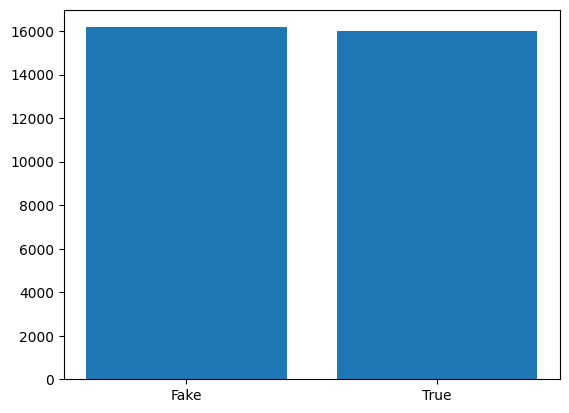

In [18]:
import matplotlib.pyplot as plt
classes = df1.label.unique()
counts = []

for i in classes:
  count = len(df[df.label==i])
  counts.append(count)

plt.bar(['Fake', 'True'], counts)
plt.show()

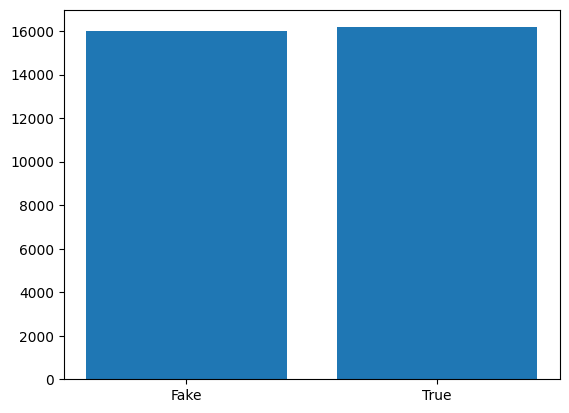

In [19]:
import matplotlib.pyplot as plt
classes = df2.label.unique()
counts = []

for i in classes:
  count = len(df[df.label==i])
  counts.append(count)

plt.bar(['Fake', 'True'], counts)
plt.show()

In [20]:
train_text, temp_text, train_labels, temp_labels = train_test_split(df.loc[:int(0.7*df.shape[0]),'data'],df.loc[:int(0.7*df.shape[0]):,'label'],
                                                                    random_state=2018,
                                                                    test_size=0.3,
                                                                    stratify=df.loc[:0.7*int(df.shape[0]),'label'])

In [21]:
val_text_cov=df1.loc[:,"data"].values
val_labels_cov=df1.loc[:,"label"].values
test_text_cov=df2.loc[:,"data"].values
test_labels_cov=df2.loc[:,"label"].values

In [22]:
test_text_cov.shape

(6820,)

In [23]:
test_labels_cov.shape

(6820,)

In [24]:
val_labels_cov[0]

0

**Tokenizer**
---



In [25]:
#from transformers import AutoTokenizer,TFAutoModel
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import transformers
from transformers import AutoModel, BertTokenizerFast
device = torch.device("cuda")

In [26]:
train_text, temp_text, train_labels, temp_labels = train_test_split(df.loc[:int(0.7*df.shape[0]),'data'],df.loc[:int(0.7*df.shape[0]):,'label'],
                                                                    random_state=2018,
                                                                    test_size=0.3,
                                                                    stratify=df.loc[:0.7*int(df.shape[0]),'label'])

In [27]:
model_name="bert-base-uncased"
bert = AutoModel.from_pretrained(model_name)
tokenizer = BertTokenizerFast.from_pretrained(model_name)

In [28]:
max_seq_len = 15
tokens_train = tokenizer.batch_encode_plus(
    train_text.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)

In [29]:
tokens_train

{'input_ids': [[101, 6902, 2703, 7499, 2015, 8112, 4518, 3006, 5823, 3047, 2664, 102, 0, 0, 0], [101, 3364, 18193, 6986, 19839, 2378, 2672, 2317, 2273, 2510, 2231, 2919, 4364, 7486, 102], [101, 2342, 6433, 5109, 4252, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0], [101, 1043, 7524, 11477, 3252, 3853, 19610, 8649, 4135, 8428, 4786, 21887, 23350, 5022, 102], [101, 2214, 7760, 24501, 3126, 12172, 2094, 9130, 5198, 6815, 24247, 6186, 2967, 2478, 102], [101, 4911, 6221, 8398, 12923, 8385, 9680, 2075, 2095, 2214, 102, 0, 0, 0, 0], [101, 2345, 4465, 2305, 2374, 2208, 13261, 2659, 5270, 3114, 102, 0, 0, 0, 0], [101, 3290, 19409, 9152, 18903, 2758, 7071, 5029, 3132, 2342, 2128, 6198, 5166, 102, 0], [101, 2176, 2327, 2375, 9786, 10214, 5050, 2757, 19442, 8398, 3607, 15113, 102, 0, 0], [101, 9969, 6404, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [101, 2859, 2327, 3259, 2758, 2827, 2865, 4311, 16939, 102, 0, 0, 0, 0, 0], [101, 20868, 2863, 3084, 21042, 12731, 2094, 5558, 2063, 3145, 2896, 3516, 6309, 102, 0], [101,

In [30]:
decode_1 = tokenizer.decode(tokens_train.input_ids[0])
print(decode_1)

[CLS] ron paul blames obama stock market crash happened yet [SEP] [PAD] [PAD] [PAD]


In [31]:
max_seq_len = 15
tokens_temp = tokenizer.batch_encode_plus(
    temp_text.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False,
    padding=True,
    return_tensors='tf',
    return_attention_mask = True,
    verbose = True
)

In [32]:
decode_temp = tokenizer.decode(tokens_temp.input_ids[0])

print(decode_temp)

[CLS] one liberia main parties calls halt election results [SEP] [PAD] [PAD] [PAD] [PAD] [PAD]


In [33]:
max_seq_len=15
tokens_val = tokenizer.batch_encode_plus(
    val_text_cov.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)
tokens_test = tokenizer.batch_encode_plus(
    test_text_cov.tolist(),
    max_length = max_seq_len,
    pad_to_max_length=True,
    truncation=True,
    return_token_type_ids=False
)


In [34]:
decode_2 = tokenizer.decode(tokens_val.input_ids[0])

print(decode_2)

[CLS] whoever says covid like flu obviously know math almost lost people [SEP] [PAD]


In [35]:
decode_3 = tokenizer.decode(tokens_test.input_ids[0])

print(decode_3)

[CLS] taking hot bath prevent new coronavirus disease taking hot bath prevent [SEP] [PAD]


In [36]:
#tokens_train['input_ids'].shape

In [37]:
#tokens_train['attention_mask'].shape

In [38]:
train_seq = torch.tensor(tokens_train['input_ids'])
train_mask = torch.tensor(tokens_train['attention_mask'])
train_y = torch.tensor(train_labels.tolist())
val_seq = torch.tensor(tokens_val['input_ids'])
val_mask = torch.tensor(tokens_val['attention_mask'])
val_y = torch.tensor(val_labels_cov.tolist())
test_seq = torch.tensor(tokens_test['input_ids'])
test_mask = torch.tensor(tokens_test['attention_mask'])
test_y = torch.tensor(test_labels_cov.tolist())

In [39]:
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
batch_size = 4
train_data = TensorDataset(train_seq, train_mask, train_y)
train_sampler = RandomSampler(train_data)
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)
val_data = TensorDataset(val_seq, val_mask, val_y)
val_sampler = SequentialSampler(val_data)
val_dataloader = DataLoader(val_data, sampler = val_sampler, batch_size=batch_size)

In [40]:
#y_train = train_labels.values
#y_train


**Model**
---



In [41]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.initializers import TruncatedNormal
from tensorflow.keras.losses import CategoricalCrossentropy,BinaryCrossentropy
from tensorflow.keras.metrics import CategoricalAccuracy,BinaryAccuracy
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model

In [42]:
for param in bert.parameters():
    param.requires_grad = False

In [43]:
class BERT_Arch(nn.Module):

    def __init__(self, bert):
      super(BERT_Arch, self).__init__()
      self.bert = bert
      self.dropout = nn.Dropout(0.1)
      self.relu =  nn.ReLU()
      self.fc1 = nn.Linear(768,512)
      self.fc2 = nn.Linear(512,2)
      self.softmax = nn.LogSoftmax(dim=1)

    def forward(self, sent_id,mask):
      _, cls_hs = self.bert(sent_id, attention_mask=mask, return_dict=False)
      #_, cls_hs = self.bert(sent_id, return_dict=False)
      x = self.fc1(cls_hs)
      x = self.relu(x)
      x = self.dropout(x)
      x = self.fc2(x)
      x = self.softmax(x)
      return x

In [44]:
device = torch.device("cuda")
model = BERT_Arch(bert)
model= model.to(device)

In [44]:
from transformers import AdamW
optimizer = AdamW(model.parameters(), lr = 2e-05)

In [45]:
from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight(
                                        class_weight = "balanced",
                                        classes = np.unique(train_labels),
                                        y = train_labels
                                    )
class_weights = dict(zip(np.unique(train_labels), class_weights))

li=[]
li.append(class_weights[0])
li.append(class_weights[1])
print(li)

[0.992631313767477, 1.0074789056507287]


In [46]:
weights= torch.tensor(li,dtype=torch.float)
weights = weights.to(device)
cross_entropy  = nn.NLLLoss(weight=weights)
epochs = 20

In [47]:
def train():
  model.train()
  total_loss, total_accuracy = 0, 0
  total_preds=[]
  for step,batch in enumerate(train_dataloader):
    if step % 50 == 0 and not step == 0:
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(train_dataloader)))
    batch = [r.to(device) for r in batch]
    sent_id, mask, labels = batch
    model.zero_grad()
    preds = model(sent_id, mask)
    loss = cross_entropy(preds, labels)
    total_loss = total_loss + loss.item()
    loss.backward()
    #gradients are clipped to prevent the exploding gradient problem which is an unusual update in gradients during back propagation
    torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
    optimizer.step()
    preds=preds.detach().cpu().numpy()
    total_preds.append(preds)
  avg_loss = total_loss / len(train_dataloader)
  total_preds  = np.concatenate(total_preds, axis=0)
  return avg_loss, total_preds

In [48]:
def evaluate():
  print("\nEvaluating...")
  model.eval()
  total_loss, total_accuracy = 0, 0
  total_preds = []
  for step,batch in enumerate(val_dataloader):
    if step % 50 == 0 and not step == 0:
      print('  Batch {:>5,}  of  {:>5,}.'.format(step, len(val_dataloader)))
    batch = [t.to(device) for t in batch]
    sent_id, mask, labels = batch
    #sent_id, labels = batch

    with torch.no_grad():
      preds = model(sent_id, mask)
      #preds = model(sent_id, mask)

      # compute the validation loss between actual and predicted values
      loss = cross_entropy(preds,labels)
      total_loss = total_loss + loss.item()
      preds = preds.detach().cpu().numpy()
      total_preds.append(preds)
  avg_loss = total_loss / len(val_dataloader)
  total_preds  = np.concatenate(total_preds, axis=0)
  return avg_loss, total_preds

In [49]:
best_valid_loss = float('inf')
train_losses=[]
valid_losses=[]
for epoch in range(epochs):
    print('\n Epoch {:} / {:}'.format(epoch + 1, epochs))
    train_loss, _ = train()
    valid_loss, _ = evaluate()
    #weights of the model with the lowest validation loss are saved
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        torch.save(model.state_dict(), 'saved_weights.pt')
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)
    print(f'\nTraining Loss: {train_loss:.3f}')
    print(f'Validation Loss: {valid_loss:.3f}')


 Epoch 1 / 20
  Batch    50  of  3,941.
  Batch   100  of  3,941.
  Batch   150  of  3,941.
  Batch   200  of  3,941.
  Batch   250  of  3,941.
  Batch   300  of  3,941.
  Batch   350  of  3,941.
  Batch   400  of  3,941.
  Batch   450  of  3,941.
  Batch   500  of  3,941.
  Batch   550  of  3,941.
  Batch   600  of  3,941.
  Batch   650  of  3,941.
  Batch   700  of  3,941.
  Batch   750  of  3,941.
  Batch   800  of  3,941.
  Batch   850  of  3,941.
  Batch   900  of  3,941.
  Batch   950  of  3,941.
  Batch 1,000  of  3,941.
  Batch 1,050  of  3,941.
  Batch 1,100  of  3,941.
  Batch 1,150  of  3,941.
  Batch 1,200  of  3,941.
  Batch 1,250  of  3,941.
  Batch 1,300  of  3,941.
  Batch 1,350  of  3,941.
  Batch 1,400  of  3,941.
  Batch 1,450  of  3,941.
  Batch 1,500  of  3,941.
  Batch 1,550  of  3,941.
  Batch 1,600  of  3,941.
  Batch 1,650  of  3,941.
  Batch 1,700  of  3,941.
  Batch 1,750  of  3,941.
  Batch 1,800  of  3,941.
  Batch 1,850  of  3,941.
  Batch 1,900  of  3,94

**ROC-AUC plot**

In [50]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, roc_curve, auc

def evaluate_roc(probs, y_true):
    """
    - Print AUC and accuracy on the test set
    - Plot ROC
    @params    probs (np.array): an array of predicted probabilities with shape (len(y_true), 2)
    @params    y_true (np.array): an array of the true values with shape (len(y_true),)
    """
    preds = probs[:, 1]
    fpr, tpr, threshold = roc_curve(y_true, preds)
    roc_auc = auc(fpr, tpr)
    print(f'AUC: {roc_auc:.4f}')

    # Get accuracy over the test set
    y_pred = np.where(preds >= 0.5, 1, 0)
    accuracy = accuracy_score(y_true, y_pred)
    print(f'Accuracy: {accuracy*100:.2f}%')

    # Plot ROC AUC
    plt.figure(figsize=(8, 6))  # Increase the figure size if needed
    plt.plot(fpr, tpr, 'b', label='AUC = %0.2f, Accuracy = %0.2f%%' % (roc_auc, accuracy*100))
    plt.plot([0, 1], [0, 1], 'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.xlabel('False Positive Rate', fontsize=20)  # Increase the font size here
    plt.ylabel('True Positive Rate', fontsize=20)  # Increase the font size here
    plt.title('Receiver Operating Characteristic', fontsize=24)  # Increase the font size here
    plt.legend(loc='lower right', fontsize=12)  # You can also increase the font size for the legend if needed
    plt.grid(True)  # Add grid lines
    plt.show()


**Validation set**

In [51]:
#model.load_state_dict(torch.load(path))
with torch.no_grad():
  preds = model(val_seq.to(device),val_mask.to(device))
  preds1 = preds.detach().cpu().numpy()
preds = np.argmax(preds1, axis = 1)
test_y = torch.tensor(val_labels_cov.tolist())
print(classification_report(test_y, preds))

              precision    recall  f1-score   support

           0       0.77      0.71      0.74      8732
           1       0.73      0.79      0.76      8803

    accuracy                           0.75     17535
   macro avg       0.75      0.75      0.75     17535
weighted avg       0.75      0.75      0.75     17535



In [52]:
import torch.nn.functional as F
prb = torch.from_numpy(preds1)
probsv = F.softmax(prb, dim=1).cpu().numpy()

In [53]:
probsv.shape

(17535, 2)

In [54]:
val_y.shape

torch.Size([17535])

AUC: 0.8183
Accuracy: 74.84%


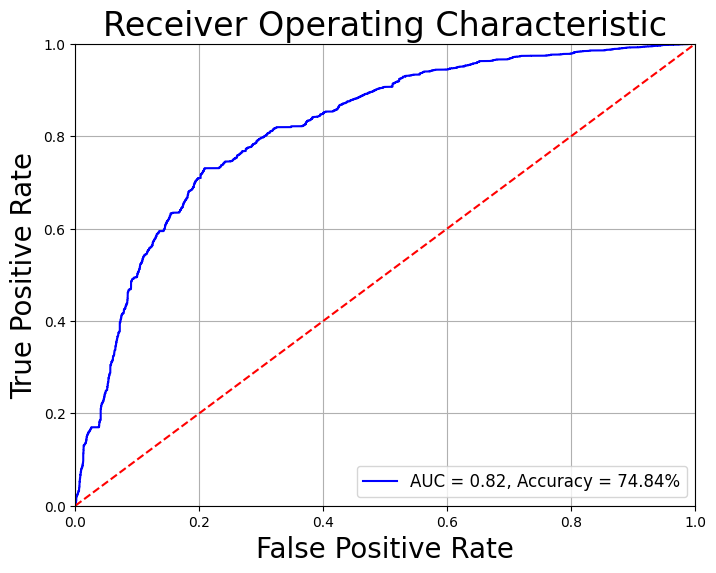

In [55]:
evaluate_roc(probsv, val_y)

**Test set**

In [56]:
#model.load_state_dict(torch.load(path))
with torch.no_grad():
  preds = model(test_seq.to(device),test_mask.to(device))
  preds2 = preds.detach().cpu().numpy()
preds = np.argmax(preds2, axis = 1)
test_y = torch.tensor(test_labels_cov.tolist())
print(classification_report(test_y, preds))

              precision    recall  f1-score   support

           0       0.78      0.71      0.74      3455
           1       0.73      0.79      0.76      3365

    accuracy                           0.75      6820
   macro avg       0.75      0.75      0.75      6820
weighted avg       0.75      0.75      0.75      6820



In [57]:
preds.shape

(6820,)

In [58]:
import torch.nn.functional as F
prb = torch.from_numpy(preds2)
probs2 = F.softmax(prb, dim=1).cpu().numpy()

In [59]:
probs2.shape

(6820, 2)

AUC: 0.8147
Accuracy: 75.09%


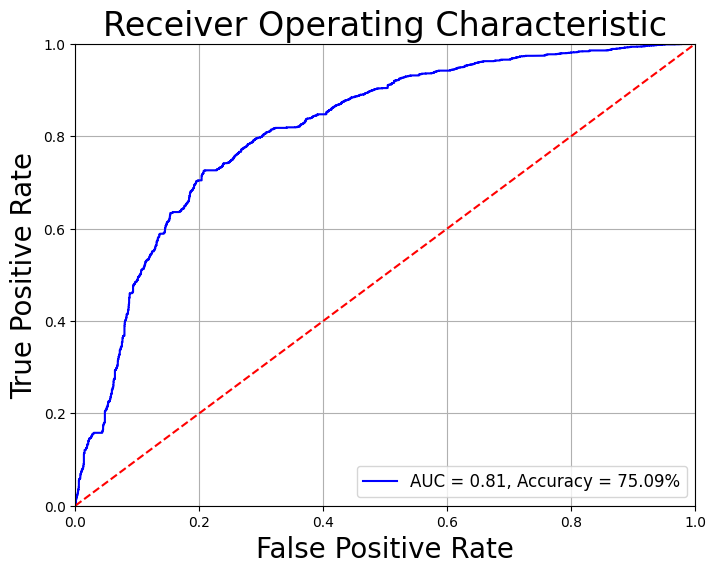

In [60]:
evaluate_roc(probs2, test_y)

In [61]:
import torch.nn.functional as F
with torch.no_grad():
  preds = model(train_seq.to(device),train_mask.to(device))
  preds3 = preds.detach().cpu().numpy()
  tt = torch.from_numpy(preds3)
  test_y = torch.tensor(train_labels.tolist())
  probst = F.softmax(tt, dim=1).cpu().numpy()

In [62]:
probst.shape

(15761, 2)

In [63]:
(15761, 2)

(15761, 2)

AUC: 0.8680
Accuracy: 77.74%


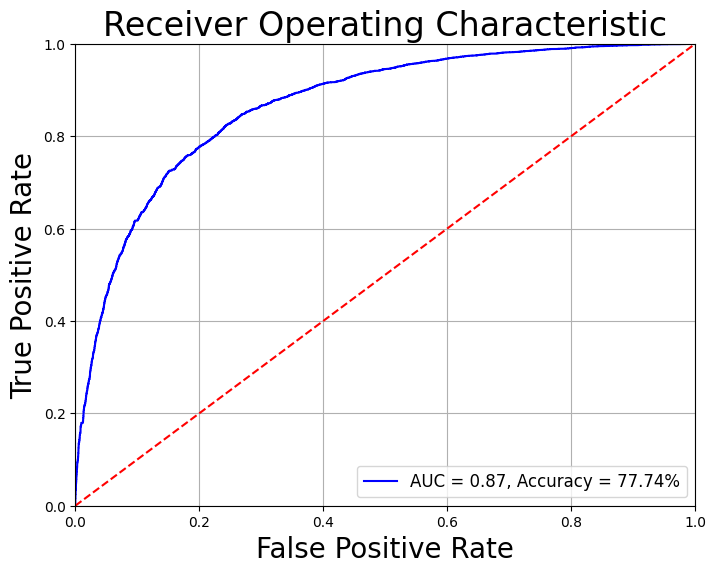

In [64]:
evaluate_roc(probst,train_y)

In [65]:
probsv=probsv[:6820]
probsv.shape

(6820, 2)

In [66]:
val_y=val_y[:6820]
val_y.shape

torch.Size([6820])

In [67]:
test_y=test_y[:6820]
test_y.shape

torch.Size([6820])

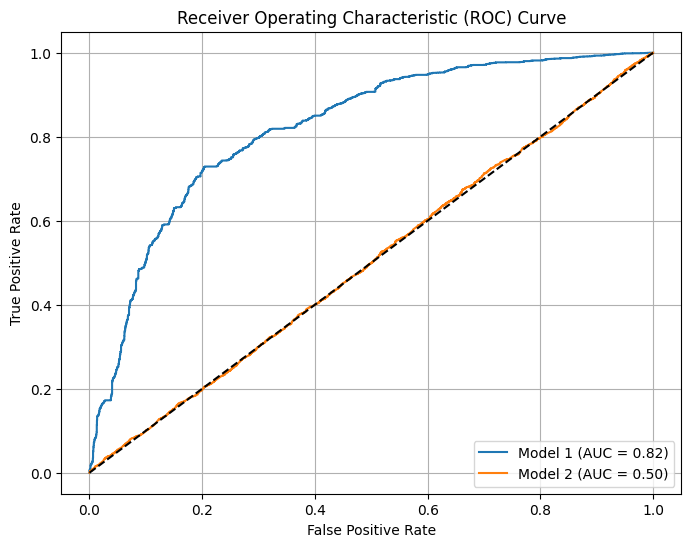

In [68]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

# Assuming you have two sets of predicted probabilities and corresponding y_test
# Replace these with your actual data

# Compute the ROC curve and AUC for both sets of predicted probabilities
fpr1, tpr1, _ = roc_curve(val_y, probsv[:,1])
roc_auc1 = roc_auc_score(val_y, probsv[:,1])

fpr2, tpr2, _ = roc_curve(test_y, probs2[:,1])
roc_auc2 = roc_auc_score(test_y, probs2[:,1])

# Plot the ROC curves for both sets
plt.figure(figsize=(8, 6))
plt.plot(fpr1, tpr1, label='Model 1 (AUC = %0.2f)' % roc_auc1)
plt.plot(fpr2, tpr2, label='Model 2 (AUC = %0.2f)' % roc_auc2)
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line representing random classifier
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid(True)  # Add grid lines
plt.show()


Test

**Model_Saving**
---

In [45]:
path = '/content/saved_weights.pt'
model.load_state_dict(torch.load(path))

<All keys matched successfully>

**LIME**
---



In [46]:
# for LIME import necessary packages
from lime import lime_text
from lime.lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline
from lime.lime_text import IndexedString,IndexedCharacters
from lime.lime_base import LimeBase
from sklearn.linear_model import Ridge, lars_path
from lime.lime_text import explanation
from functools import partial
import scipy as sp
from sklearn.utils import check_random_state
import numpy as np
import lime
import torch
import torch.nn.functional as F
from lime.lime_text import LimeTextExplainer
from transformers import AutoTokenizer, AutoModelForSequenceClassification

In [47]:
class_names = ['Real','Fake']
explainer = LimeTextExplainer(class_names=class_names)

**BERT tokenizer function**

In [48]:
def tokenize_bert(x):
  tokens_test = tokenizer.batch_encode_plus(
      list(x[:]),
      #list(x[:].values())[1],
      max_length = max_seq_len,
      pad_to_max_length=True,
      truncation=True,
      return_token_type_ids=False
  )
  test_seq = torch.tensor(tokens_test['input_ids'])
  test_mask = torch.tensor(tokens_test['attention_mask'])
  return test_seq,test_mask

**Predict Probability function**

In [49]:
import torch.nn.functional as F
def predict_probab(x):
  input_ids,attention_mask=tokenize_bert(x)
  out= model(input_ids.to(device),attention_mask.to(device))
  outt1 = out.detach().cpu().numpy()
  tt = torch.from_numpy(outt1)
  probs = F.softmax(tt, dim=1).cpu().numpy()
  return probs

In [52]:
True_Positive ="australians call local communicable disease control branch would seen home doctor free"
TP_exp = explainer.explain_instance(True_Positive, predict_probab, labels=(1, ),distance_metric='cosine',num_features=10, num_samples=500)
TP_exp.show_in_notebook()

In [53]:
TP_exp.as_list()

[('would', -0.18809789402864235),
 ('doctor', -0.15602584451158028),
 ('seen', -0.14408675381081987),
 ('australians', -0.1362557349641813),
 ('disease', -0.10805398320154133),
 ('communicable', -0.09176930565066395),
 ('free', -0.08422343589751288),
 ('local', 0.0764735374230549),
 ('control', -0.06166100827560887),
 ('call', -0.03556454451016315)]

In [54]:
True_Negative ="covid virus transmitted areas hot humid climates"
TN_exp = explainer.explain_instance(True_Negative, predict_probab, labels=(1, ),distance_metric='cosine',num_features=10, num_samples=500)
TN_exp.show_in_notebook()

In [55]:
TN_exp.as_list()

[('areas', 0.08831835521350792),
 ('climates', 0.052851822603970956),
 ('humid', 0.051021225613097625),
 ('virus', -0.02116015714219136),
 ('hot', 0.020407046177180206),
 ('covid', 0.011828842490988594),
 ('transmitted', 0.002254565936885579)]

In [56]:
False_Positive ="fact prolonged use medical masks properly worn cause co intoxication oxygen deficiency"
FP_exp = explainer.explain_instance(False_Positive, predict_probab, labels=(1, ),distance_metric='cosine',num_features=10, num_samples=500)
FP_exp.show_in_notebook()

In [57]:
FP_exp.as_list()

[('fact', -0.3828899161434759),
 ('worn', -0.14219164798585107),
 ('masks', -0.11924673900892216),
 ('medical', -0.11595321461885363),
 ('cause', -0.06329899086725416),
 ('prolonged', 0.061995244921976875),
 ('intoxication', 0.05017510871396669),
 ('properly', -0.04485748598715701),
 ('co', 0.03415610592061939),
 ('oxygen', -0.029499056769369446)]

In [58]:
False_Negative ="exposure alter structure function hemoglobin causing coronavirus patients die oxygen dep"
FN_exp = explainer.explain_instance(False_Negative, predict_probab, labels=(1, ),distance_metric='cosine',num_features=10, num_samples=500)
FN_exp.show_in_notebook()

In [59]:
FN_exp.as_list()

[('exposure', 0.17930118560056812),
 ('alter', -0.07690744387735131),
 ('coronavirus', -0.07411148137219753),
 ('die', -0.06889165385687973),
 ('dep', -0.05997605646276773),
 ('hemoglobin', 0.04704152948759503),
 ('function', 0.02732631569411801),
 ('causing', -0.01896160999381351),
 ('oxygen', 0.01558095243418362),
 ('patients', -0.013058148644483208)]

**SHAP**
---

In [60]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 6.0 MB/s eta 0:00:00


In [61]:
!pip install nlp

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 10.9 MB/s eta 0:00:00


In [65]:
dfdd=pd.read_csv("SHAP_Exp_cases.csv")
dfdd

,text,label,Pred
0,trump said covid like flu amp contained scient...,0,0
1,taking hot bath prevent new coronavirus diseas...,1,1
2,missing link coronavirus jump bats humans coul...,1,0
3,effective thermal scanners detecting people in...,0,1


In [66]:
from nlp import Dataset
df3=pd.DataFrame({"label":[],"text":[]})
df3["label"]=dfdd.loc[:]["label"]
df3["text"]=dfdd.loc[:]["text"]
dataset = Dataset.from_pandas(df3)
#dataset[:2]

In [67]:
def tokenize_bert(x):
  tokens_test = tokenizer.batch_encode_plus(
      list(x[:]),
      #list(x[:].values())[1],
      max_length = max_seq_len,
      pad_to_max_length=True,
      truncation=True,
      return_token_type_ids=False
  )
  #print(x[:].dtype)
  test_seq = torch.tensor(tokens_test['input_ids'])
  test_mask = torch.tensor(tokens_test['attention_mask'])
  return test_seq,test_mask

In [68]:
def predict_probab(x):
    input_ids,attention_mask=tokenize_bert(x)
    preds = model(input_ids.to(device),attention_mask.to(device))
    preds = preds.detach().cpu().numpy()
    scores = (np.exp(preds).T / np.exp(preds).sum(-1)).T
    val = sp.special.logit(scores[:,1])
    return val

In [69]:
import shap
import transformers
import nlp
import torch
import numpy as np
import scipy as sp
explainer = shap.Explainer(predict_probab, tokenizer)

shap_values = explainer(dataset, fixed_context=1)

In [70]:
shap.plots.text(shap_values[:1])

In [71]:
shap.plots.text(shap_values[1:2])

In [72]:
shap.plots.text(shap_values[2:3])

In [73]:
shap.plots.text(shap_values[3:4])

**ELI5**
---

In [74]:
import scipy as sp
import torch.nn.functional as F

In [75]:
def tokenize_bert(x):
  tokens_test = tokenizer.batch_encode_plus(
      list(x[:]),
      #list(x[:].values())[1],
      max_length = max_seq_len,
      pad_to_max_length=True,
      truncation=True,
      return_token_type_ids=False
  )
  #print(x[:].dtype)
  test_seq = torch.tensor(tokens_test['input_ids'])
  test_mask = torch.tensor(tokens_test['attention_mask'])
  return test_seq,test_mask

In [76]:
import torch.nn.functional as F
def predict_probab(x):
  input_ids,attention_mask=tokenize_bert(x)
  out= model(input_ids.to(device),attention_mask.to(device))
  outt1 = out.detach().cpu().numpy()
  tt = torch.from_numpy(outt1)
  probs = F.softmax(tt, dim=1).cpu().numpy()
  return probs

In [77]:
import eli5
from eli5.lime import TextExplainer
te = TextExplainer(random_state=42,n_samples=200,expand_factor=10)
te.fit(True_Positive, predict_probab)
print(True_Positive)
te.show_prediction()

australians call local communicable disease control branch would seen home doctor free


In [78]:
import eli5
from eli5.lime import TextExplainer
te = TextExplainer(random_state=42,n_samples=200,expand_factor=10)
te.fit(True_Negative, predict_probab)
print(True_Negative)
te.show_prediction(target_names=["Real","Fake"])

covid virus transmitted areas hot humid climates


In [79]:
import eli5
from eli5.lime import TextExplainer
te = TextExplainer(random_state=42,n_samples=200,expand_factor=10)
te.fit(False_Positive, predict_probab)
print(False_Positive)
te.show_prediction(target_names=["Real","Fake"])

fact prolonged use medical masks properly worn cause co intoxication oxygen deficiency


In [80]:
te.show_weights(top=20)

Weight?,Feature
+1.177,x15
+0.768,<BIAS>
+0.502,x8
+0.398,x9
+0.388,x21
+0.368,x16
+0.351,x7
+0.251,x4
+0.173,x13
+0.166,x2


In [81]:
import eli5
from eli5.lime import TextExplainer


te = TextExplainer(random_state=42,n_samples=200,expand_factor=10)
te.fit(False_Negative, predict_probab)
print(False_Negative)
te.show_prediction(target_names=["Real","Fake"])

exposure alter structure function hemoglobin causing coronavirus patients die oxygen dep


In [82]:
te.show_weights(top=20)

Weight?,Feature
+0.879,x10
+0.825,<BIAS>
+0.639,x17
+0.492,x11
+0.444,x9
+0.428,x7
+0.378,x15
+0.175,x14
+0.171,x19
+0.169,x2


**Anchor**
---

In [83]:
!pip install alibi

In [84]:
from __future__ import print_function
%load_ext autoreload
%autoreload 2
import spacy
import string
import numpy as np
import numpy as np
np.random.seed(1)
import sys
import sklearn
import sklearn.ensemble
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from alibi.explainers import AnchorText
from alibi.datasets import fetch_movie_sentiment
from alibi.utils import spacy_model
from alibi.utils import DistilbertBaseUncased, BertBaseUncased, RobertaBase

In [85]:
model1 = 'en_core_web_md'
spacy_model(model=model1)
nlp = spacy.load(model1)

In [86]:
def tokenize_berta(x):
  tokens_test_temp = tokenizer.batch_encode_plus(
      list(x[:]),
      #list(x[:].values())[1],
      max_length = max_seq_len,
      pad_to_max_length=True,
      truncation=True,
      return_token_type_ids=False
  )
  #print(x[:].dtype)
  test_seq_temp = torch.tensor(tokens_test_temp['input_ids'])
  test_mask_temp = torch.tensor(tokens_test_temp['attention_mask'])
  return test_seq_temp,test_mask_temp

In [92]:
def predict_probab_anchor_max(x):
  #for i in x:
  input_ids,attention_mask=tokenize_berta(x)
  preds = model(input_ids.to(device),attention_mask.to(device))
  preds = preds.detach().cpu().numpy()
  tt = torch.from_numpy(preds)
  pred1 = np.argmax(tt, axis = 1)
  return np.array(pred1)

In [93]:
#class_names = df2.label
class_names=["Real","Fake"]
print(class_names)
# select instance to be explained
text = "Trump looms behind both Obama and Haley speeches"
print("* Text: %s" % text)

#data=df2.data
# compute class prediction
pred = class_names[predict_probab_anchor_max(text)[0]]
alternative =  class_names[1 - predict_probab_anchor_max(text)[0]]
print("* Prediction: %s" % pred)
print("* alternative: %s" % alternative)

['Real', 'Fake']
* Text: Trump looms behind both Obama and Haley speeches
* Prediction: Fake
* alternative: Real


In [94]:
explanation

<module 'lime.explanation' from '/usr/local/lib/python3.10/dist-packages/lime/explanation.py'>

In [95]:
language_model =BertBaseUncased()

All PyTorch model weights were used when initializing TFBertForMaskedLM.

All the weights of TFBertForMaskedLM were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertForMaskedLM for predictions without further training.


In [96]:
explainer = AnchorText(
    predictor=predict_probab_anchor_max,
    sampling_strategy="language_model",   # use language model to predict the masked words
    language_model=language_model,        # language model to be used
    filling="parallel",                   # just one pass through the transformer
    sample_proba=0.5,                     # probability of masking a word
    frac_mask_templates=0.1,              # fraction of masking templates (smaller value -> faster, less diverse)
    use_proba=True,                       # use words distribution when sampling (if False sample uniform)
    top_n=20,                             # consider the fist 20 most likely words
    temperature=1.0,                      # higher temperature implies more randomness when sampling
    stopwords=['and', 'a', 'but', 'in'],  # those words will not be sampled
    batch_size_lm=32,                     # language model maximum batch size
)

In [98]:
explanation = explainer.explain(True_Positive, threshold=0.95)

In [99]:
print('Anchor: %s' % (' AND '.join(explanation.anchor)))
print('Precision: %.2f' % explanation.precision)
print('\nExamples where anchor applies and model predicts %s:' % pred)
print('\n'.join([x for x in explanation.raw['examples'][-1]['covered_true']]))
print('\nExamples where anchor applies and model predicts %s:' % alternative)
print('\n'.join([x for x in explanation.raw['examples'][-1]['covered_false']]))

Anchor: would AND call AND disease AND seen AND australians
Precision: 0.98

Examples where anchor applies and model predicts Fake:
australians call it communicable disease that they would seen home from ।
australians call it communicable disease that people would seen home visits in
australians call this communicable disease which they would seen home of ।
australians call it communicable disease what they would seen home heal because
australians call it communicable disease that they would seen home before if
australians call it communicable disease as they would seen home to ।
australians call the communicable disease which who would seen home before as
australians call this communicable disease that it would seen home before in
australians call it communicable disease as we would seen home leave by
australians call local infectious disease control and would seen home doctor ।

Examples where anchor applies and model predicts Real:
australians call it communicable disease as one wou

In [100]:
explanation = explainer.explain(True_Negative, threshold=0.95)

In [101]:
print('Anchor: %s' % (' AND '.join(explanation.anchor)))
print('Precision: %.2f' % explanation.precision)
print('\nExamples where anchor applies and model predicts %s:' % pred)
print('\n'.join([x for x in explanation.raw['examples'][-1]['covered_true']]))
print('\nExamples where anchor applies and model predicts %s:' % alternative)
print('\n'.join([x for x in explanation.raw['examples'][-1]['covered_false']]))

Anchor: climates
Precision: 1.00

Examples where anchor applies and model predicts Fake:
the virus transmitted areas in arid climates
the virus transmitted areas in warm climates
the virus transmitted areas in warm climates
the virus transmitted areas during tropical climates
the virus transmitted areas of arid climates
the virus transmitted areas in tropical climates
the virus transmitted areas from different climates
the virus transmitted areas of different climates
the virus transmitted areas in tropical climates
the virus transmitted areas with arid climates

Examples where anchor applies and model predicts Real:



In [102]:
explanation = explainer.explain(False_Positive, threshold=0.95)

In [103]:
print('Anchor: %s' % (' AND '.join(explanation.anchor)))
print('Precision: %.2f' % explanation.precision)
print('\nExamples where anchor applies and model predicts %s:' % pred)
print('\n'.join([x for x in explanation.raw['examples'][-1]['covered_true']]))
print('\nExamples where anchor applies and model predicts %s:' % alternative)
print('\n'.join([x for x in explanation.raw['examples'][-1]['covered_false']]))

Anchor: fact AND worn AND masks AND use AND properly
Precision: 0.95

Examples where anchor applies and model predicts Fake:
fact that use of masks properly worn cause co intoxication problems ।
fact that use of masks properly worn cause co intoxication problems cause
fact that use of masks properly worn cause co intoxication problems in
fact that use of masks properly worn cause co intoxication effects a
fact that use of masks properly worn cause co intoxication risk in
fact that use of masks properly worn cause co intoxication effects be
fact that use of masks properly worn cause co intoxication problems cause
fact that use of masks properly worn cause co intoxication problems the
fact that use of masks properly worn cause co intoxication effects cause
fact or use of masks properly worn cause co intoxication issues are

Examples where anchor applies and model predicts Real:
fact prolonged use wearing masks properly worn without co intoxication oxygen deficiency
fact we use oxygen mas

In [104]:
explanation = explainer.explain(False_Negative, threshold=0.95)

In [105]:
print('Anchor: %s' % (' AND '.join(explanation.anchor)))
print('Precision: %.2f' % explanation.precision)
print('\nExamples where anchor applies and model predicts %s:' % pred)
print('\n'.join([x for x in explanation.raw['examples'][-1]['covered_true']]))
print('\nExamples where anchor applies and model predicts %s:' % alternative)
print('\n'.join([x for x in explanation.raw['examples'][-1]['covered_false']]))

Anchor: alter
Precision: 0.99

Examples where anchor applies and model predicts Fake:
exposure alter structure of hemoglobin and and decrease with oxygen from
exposure alter structure of hemoglobin by by decrease by oxygen increase
exposure alter structure of hemoglobin by by reduce free oxygen causing
exposure alter structure of hemoglobin and thus reduce free oxygen in
exposure alter structure of hemoglobin and and reduce by oxygen reduced
exposure alter structure of hemoglobin proteins and reduce in oxygen by
exposure alter structure of hemoglobin and increase reduce with oxygen can
exposure alter structure of hemoglobin by by lower free oxygen causing
exposure alter structure of hemoglobin and decrease reduce free oxygen can
exposure alter structure of hemoglobin by increases reduce free oxygen and

Examples where anchor applies and model predicts Real:
exposure alter life in hemoglobin causing coronavirus can die oxygen dep


**Overall**
---

In [59]:
# Create empty lists to collect the information
texts = []
labels = []
probabilities = []

# Create an explainer using LIME
explainer = LimeTextExplainer(class_names=['Negative', 'Positive'])

# Generate explanations and collect the information
for i, row in df2.iterrows():
    text = row['data']
    label = row['label']
    exp = explainer.explain_instance(text, predict_probab, num_features=10,num_samples=200)
    texts.append(text)
    labels.append(label)
    probabilities.append(exp.local_pred)

# Create a new dataframe using the collected information
result_df = pd.DataFrame({
    'text': texts,
    'label': labels,
    'probabilities': probabilities
})
# Print the resulting dataframe
print(result_df)

                                                   text  label  \
0     taking hot bath prevent new coronavirus diseas...      1   
1                 coronavirus vaccines months fake news      0   
2     april different covid vaccine candidates devel...      1   
3     claim german parliament passed law september c...      0   
4     dominic raab said covid tests false positive rate      0   
...                                                 ...    ...   
6815  royal palace confirms queen elizabeth tests po...      0   
6816  claim new york times said tunisia country beta...      0   
6817       mask resellers bought million masks one week      0   
6818             rapid weather swings increase flu risk      1   
6819  ai find helpful pertinent arguably human exper...      1   

               probabilities  
0      [0.42329943633703326]  
1       [0.2288711282912822]  
2       [0.8393080432756492]  
3         [0.23890710331116]  
4      [0.09227044955968877]  
...                  

In [60]:
import pandas as pd

# Assuming you have a dataframe named 'df' with a 'probability' column
result_df['xai_label'] = result_df['probabilities'].apply(lambda x: 1 if x > 0.5 else 0)

# Print the updated dataframe
print(result_df)

                                                   text  label  \
0     taking hot bath prevent new coronavirus diseas...      1   
1                 coronavirus vaccines months fake news      0   
2     april different covid vaccine candidates devel...      1   
3     claim german parliament passed law september c...      0   
4     dominic raab said covid tests false positive rate      0   
...                                                 ...    ...   
6815  royal palace confirms queen elizabeth tests po...      0   
6816  claim new york times said tunisia country beta...      0   
6817       mask resellers bought million masks one week      0   
6818             rapid weather swings increase flu risk      1   
6819  ai find helpful pertinent arguably human exper...      1   

               probabilities  xai_label  
0      [0.42329943633703326]          0  
1       [0.2288711282912822]          0  
2       [0.8393080432756492]          1  
3         [0.23890710331116]          0

In [61]:
import pandas as pd
from sklearn.metrics import classification_report

# Assuming you have a dataframe named 'df' with 'true_labels' and 'predicted_labels' columns
true_labels = result_df['xai_label']
predicted_labels = result_df['label']

# Generate the classification report
report = classification_report(true_labels, predicted_labels)

# Print the classification report
print(report)


              precision    recall  f1-score   support

           0       0.72      0.78      0.75      3186
           1       0.80      0.74      0.77      3634

    accuracy                           0.76      6820
   macro avg       0.76      0.76      0.76      6820
weighted avg       0.76      0.76      0.76      6820



**Stage2**
---


In [ ]:
BS=shap_values.base_values
shap_values_instance=shap_values.values

In [ ]:
BS

array([1.13122785, 0.76113057, 1.10286856, ..., 1.11899555, 0.76113057,
       1.07383919])

In [ ]:
shap_values_instance

array([array([-0.13063256, -0.54570399, -0.14954809, -0.04583589,  0.69392193,
               0.0073879 , -0.07366422, -0.49224785, -0.01555478,  0.19884491,
               0.30875564,  0.33066726, -0.42830727,  0.03714934])            ,
       array([ 0.37887835, -0.6954152 ,  0.00569886, -0.26818864, -0.5178272 ,
              -0.95913456, -1.84604733,  0.33766581])                         ,
       array([ 0.04161638, -0.76169759,  0.33739239,  0.35984891,  0.20916801,
              -0.23834118,  0.74948081,  1.27447509,  0.64218598, -1.4826491 ,
              -0.13983068,  0.12907854, -0.08539131])                         ,
       ...,
       array([ 0.97743725, -2.47274495,  0.49753615,  0.85041156, -0.46933818,
              -0.02425813, -0.68037772, -1.17531478, -0.13591057, -1.83735594,
               0.35574845])                                                   ,
       array([-0.25326456,  1.10612427,  0.69638704,  0.21963237,  0.44328673,
               0.88331278,  0.310451

**CONT**
---

In [ ]:
shap_values_instance = np.array([np.sum(inner_arr) for inner_arr in shap_values_instance])

shap_values_instance

array([-0.30476767, -3.56436992,  1.03533626, ..., -4.11416686,
        3.41951585,  1.10489202])

In [ ]:
print(BS.shape)
print(shap_values_instance.shape)

(6820,)
(6820,)


In [ ]:
result = []

for i in range(len(BS)):
    result.append(shap_values_instance[i] + BS[i])

result = np.array(result)

print(result)

[ 0.82646018 -2.80323935  2.13820481 ... -2.99517131  4.18064642
  2.1787312 ]


In [ ]:
result.shape

(6820,)

In [ ]:
result_df['XAI_SHAP'] = [0 if val < 0 else 1 for val in result]

# Display the updated DataFrame
result_df.head(10)

,text,label,probabilities,xai_label,XAI_SHAP
0,taking hot bath prevent new coronavirus diseas...,1,0.586223,1,1
1,coronavirus vaccines months fake news,0,0.274414,0,0
2,april different covid vaccine candidates devel...,1,0.892295,1,1
3,claim german parliament passed law september c...,0,0.420057,0,1
4,dominic raab said covid tests false positive rate,0,0.143844,0,0
5,rumor doctors areesh hospital tested positive ...,0,0.018755,0,0
6,people diabetes may higher risk covid via,1,0.925257,1,1
7,trump coronavirus testing stopped testing righ...,0,0.369411,0,0
8,important study understand know nih begins stu...,1,0.801189,1,1
9,peter dutton quarantined nauru,0,0.530143,1,1


In [ ]:
import pandas as pd
from sklearn.metrics import classification_report
# Assuming you have a dataframe named 'df' with 'true_labels' and 'predicted_labels' columns
true_labels = result_df['XAI_SHAP']
predicted_labels = result_df['label']
# Generate the classification report
report = classification_report(true_labels, predicted_labels)
# Print the classification report
print(report)

              precision    recall  f1-score   support

           0       0.62      0.80      0.70      2682
           1       0.84      0.68      0.75      4138

    accuracy                           0.73      6820
   macro avg       0.73      0.74      0.72      6820
weighted avg       0.75      0.73      0.73      6820



**Final_plots**
---

In [ ]:
true_labels2=result_df['XAI_SHAP']
true_labels1=result_df['xai_label']

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score, accuracy_score

def plot_roc_curves2(y_true1, y_true2, y_prob):
    fpr1, tpr1, _ = roc_curve(y_true1, y_prob)
    roc_auc1 = roc_auc_score(y_true1, y_prob)

    fpr2, tpr2, _ = roc_curve(y_true2, y_prob)
    roc_auc2 = roc_auc_score(y_true2, y_prob)

    # Compute accuracy for both models
    y_pred1 = [1 if p >= 0.5 else 0 for p in y_prob]
    accuracy1 = accuracy_score(y_true1, y_pred1)

    y_pred2 = [1 if p >= 0.5 else 0 for p in y_prob]
    accuracy2 = accuracy_score(y_true2, y_pred2)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr1, tpr1, label='LIME 1 (AUC = %0.2f, Accuracy = %0.2f)' % (roc_auc1, accuracy1))
    plt.plot(fpr2, tpr2, label='SHAP 2 (AUC = %0.2f, Accuracy = %0.2f)' % (roc_auc2, accuracy2))
    plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line representing random classifier
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC)')
    plt.legend(loc='lower right')
    plt.show()

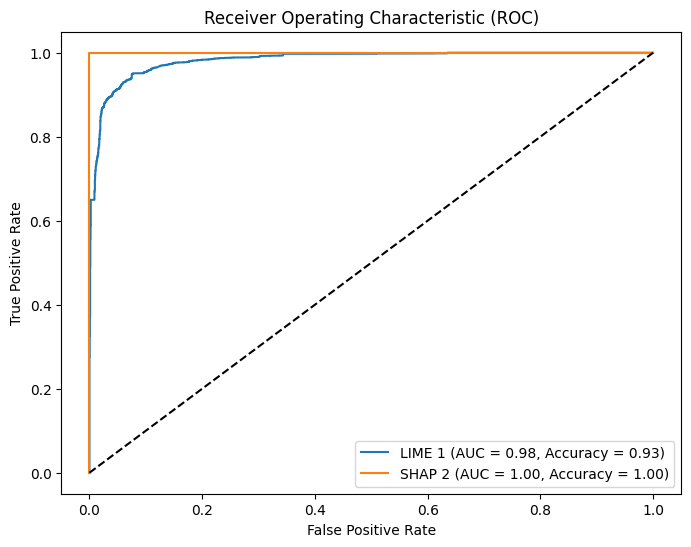

In [ ]:
plot_roc_curves2(true_labels1, true_labels2, first_elements)